(448, 663, 3)


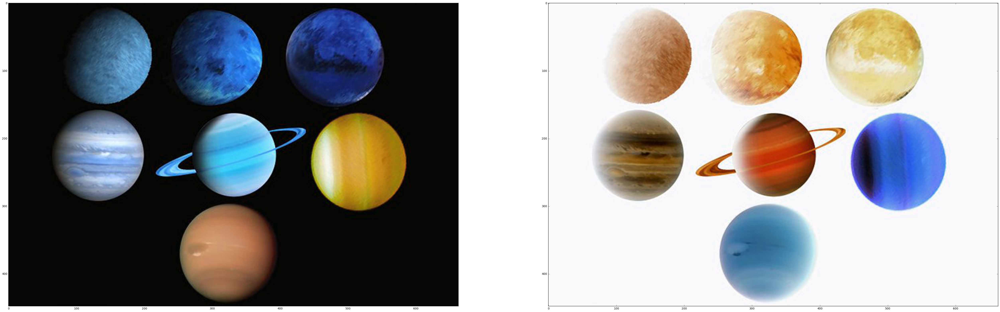

In [4]:
import cv2
from pylab import *
import numpy as np
import math
import copy

img = cv2.imread("chapter3/planet_glow.jpg")

print(img.shape)

Negative = np.zeros((img.shape[0],img.shape[1],3), 'uint8')

for i in range(0,Negative.shape[0]):
    for j in range(0,Negative.shape[1]):
        Negative[i,j,0] = 255 - img[i,j,0]
        Negative[i,j,1] = 255 - img[i,j,1]
        Negative[i,j,2] = 255 - img[i,j,2]

fig, axs = subplots(1, 2, figsize=(64, 64))
axs[0].imshow(img)
axs[0].axis('on')
axs[1].imshow(Negative)
axs[1].axis('on')
gray()
show()

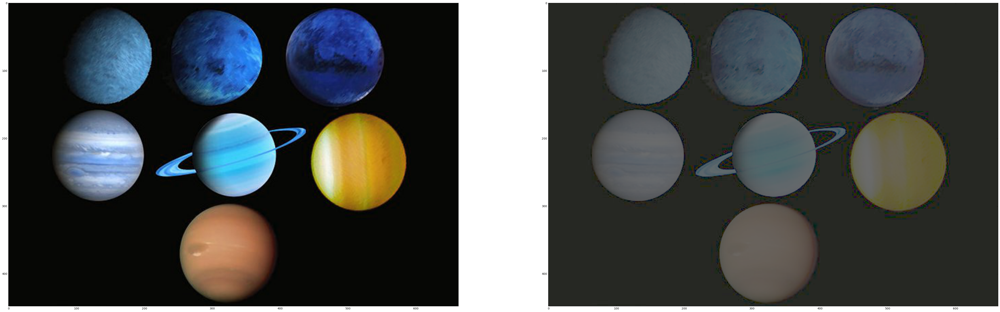

In [19]:
log = np.zeros((img.shape[0],img.shape[1],3), 'uint8')

c = 45
for i in range(0,log.shape[0]):
    for j in range(0,log.shape[1]):
        if (c*math.log(1+img[i,j,0],10)) < 0:
            log[i,j,0] = 0
        else:
            log[i,j,0] = int(c*math.log(1+img[i,j,0],10))
        if (c*math.log(1+img[i,j,1],10)) < 0:
             log[i,j,1] = 0
        else:
            log[i,j,1] = int(c*math.log(1+img[i,j,1],10))
        if (c*math.log(1+img[i,j,2],10)) < 0:
             log[i,j,2] = 0
        else:
            log[i,j,2] = int(c*math.log(1+img[i,j,2],10))
            
fig, axs = subplots(1, 2, figsize=(64, 64))
axs[0].imshow(img)
axs[0].axis('on')
axs[1].imshow(log)
axs[1].axis('on')
gray()
show()

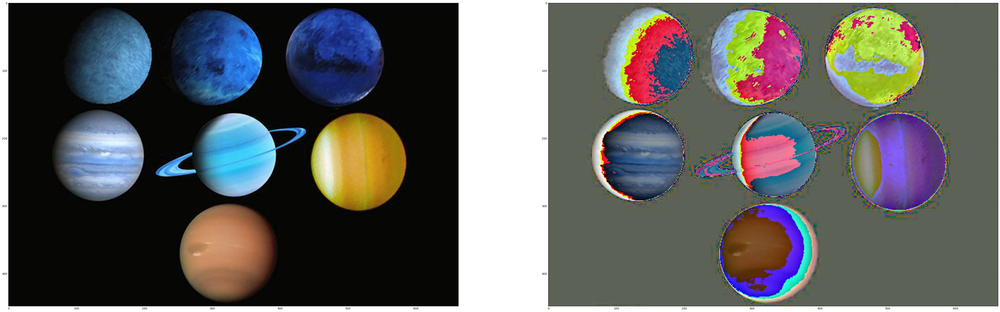

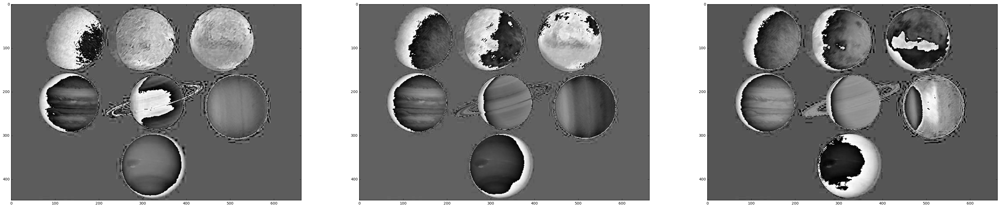

In [18]:
gamma = np.zeros((img.shape[0],img.shape[1],3), 'uint8')
g=0.4
for i in range(0,gamma.shape[0]):
    for j in range(0,gamma.shape[1]):
        gamma[i,j,0] = int(c*pow(img[i,j,0],g))
        gamma[i,j,1] = int(c*pow(img[i,j,1],g))
        gamma[i,j,2] = int(c*pow(img[i,j,2],g))
        
fig, axs = subplots(1, 2, figsize=(64, 64))
axs[0].imshow(img)
axs[0].axis('on')
axs[1].imshow(gamma)
axs[1].axis('on')
gray()
show()
fig, axs = subplots(1, 3, figsize=(48, 48))
axs[0].imshow(gamma[:,:,0])
axs[0].axis('on')
axs[1].imshow(gamma[:,:,1])
axs[1].axis('on')
axs[2].imshow(gamma[:,:,2])
axs[2].axis('on')
gray()
show()

(448, 663, 3) histogram_equalization


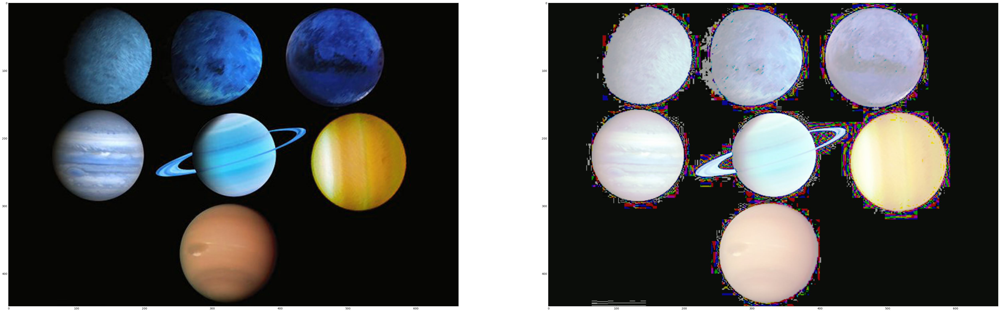

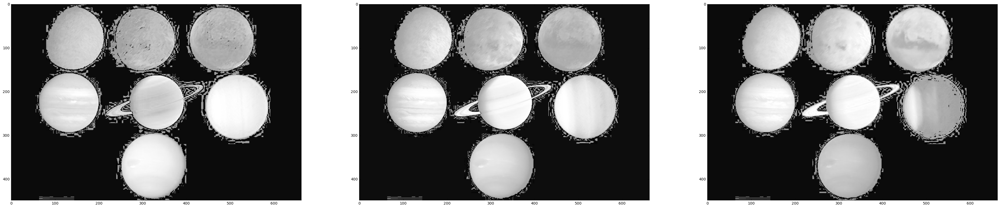

In [57]:
def image_histogram_equalization(image):
    color = np.zeros(256)
    for i in range (image.shape[0]):
        for j in range (image.shape[1]):
            color[image[i,j]]+=1
            
    for i in range (256):
        color[i]/=image.shape[0]*image.shape[1]
    
    s=np.zeros(256)
    
    for i in range (256):
        alls=0
        for j in range (i):
            alls+=color[j]
        
        s[i]=255*alls
    
    result = np.zeros((img.shape[0],img.shape[1]), 'uint8')
    for i in range (image.shape[0]):
        for j in range (image.shape[1]):
            result[i,j]=s[image[i,j]]

    return result


hist_b = image_histogram_equalization(img[:,:,0])
hist_g = image_histogram_equalization(img[:,:,1])
hist_r = image_histogram_equalization(img[:,:,2])

rgbArray = np.dstack((hist_b,hist_g,hist_r))

print(rgbArray.shape,'histogram_equalization')
fig, axs = subplots(1, 2, figsize=(64, 64))
axs[0].imshow(img)
axs[0].axis('on')
axs[1].imshow(rgbArray)
axs[1].axis('on')
gray()
show()
fig, axs = subplots(1, 3, figsize=(48, 48))
axs[0].imshow(hist_b)
axs[0].axis('on')
axs[1].imshow(hist_g)
axs[1].axis('on')
axs[2].imshow(hist_r)
axs[2].axis('on')
gray()
show()